# NIFTY: A NON-LOCAL IMAGE FLOW MATCHING FOR TEXTURE SYNTHESIS


In [2]:
from code.method import *
from code.networks import *

In [ ]:
#inference metrics
if False:
    output_size = 512
    t0 = time.time()
    for j in range(1,13):
        im_name='raad%s.png'%j
        path=os.path.join('./comp/raad_256/', im_name)
        img_torch = Tensor_load(path)[...]
        img_torch0 = torch.clone(img_torch)*2-1
        os.makedirs('./comp/%s/nifty'%(im_name.split('.')[0]), exist_ok=True)
        for i in range(10):
            torch.manual_seed(i)
            synth= Diffusion(img_torch0,rs=1,T=15,k=5,patchsize=16,stride=4,octaves=4,size=(512,512),renoise=0.5,warmup=0,memory=True,show=False)
            imsave('../comp/%s/nifty/%d'%(im_name.split('.')[0],i),synth)
    t0 = time.time()-t0      
    print('Elapsed time : ', t0/10/12)
    #imsave('../comp/kwatra_peppeJIPEVsdNMK :wrs',synth*2-1)
    # loss plot    
    fig = plt.figure()
    Tensor_display(synth)


In [24]:
imsize = 256 # 128 # 256 # 512 : desired input/output resolution
imsize_out = 256 
BATCH_SIZE = 1 # should be one, we only want to optimize one image at a time here

data_rep = 'textures/'
! ls textures/
im_name  =   'red_peppers_256.jpg' # cordes_256.png      radishes_256.jpg    red_peppers_256.jpg      pumkins_512.png     rafia.jpg           tiles.png

save_rep = 'res/'

file_name = data_rep + im_name
 
## load image as a Tensor
img_torch = Tensor_load(file_name)[...]#,:64,:64]
#img_torch = F.interpolate(img_torch, size=(imsize, imsize), mode='bicubic') # resize to desired size
img_torch0 = torch.clone(img_torch)*2-1


t0 = time.time()
#synth= Diffusion(img_torch0,rs=.2,T=30,k=5,patchsize=16,stride=4,octaves=3,size=(1024,1024),renoise=0.5,warmup=0,memory=True) 
synth= Diffusion(img_torch0,rs=1,T=10,k=5,patchsize=16,stride=4,octaves=3,size=(512,512),renoise=0.5,warmup=0,memory=True,show=False)

t0 = time.time()-t0      
print('Elapsed time : ', t0, ' seconds')


cordes.png	   fabric.jpg  pumkins_512.png	 rafia.jpg	      tiles.png
_DSC0418_2048.jpg  paper.jpg   radishes_256.jpg  red_peppers_256.jpg
Elapsed time :  0.5092589855194092  seconds


Patch pixel blending

In [25]:
imsize = 256 # 128 # 256 # 512 : desired input/output resolution
imsize_out = 256 
BATCH_SIZE = 1 # should be one, we only want to optimize one image at a time here

data_rep = 'textures/'
! ls textures/
im_name  =   'cordes.png' #'red_peppers_256.jpg' # cordes_256.png      radishes_256.jpg    red_peppers_256.jpg      pumkins_512.png     rafia.jpg           tiles.png

save_rep = 'res/'


file_name = data_rep + 'red_peppers_256.jpg' # 'cordes.png' #'red_peppers_256.jpg' # cordes_256.png      radishes_256.jpg    red_peppers_256.jpg      pumkins_512.png     rafia.jpg           tiles.png
file_name2 = data_rep + 'cordes.png'# 'radishes_256.jpg' # 'red_peppers_256.jpg' # cordes_256.png      radishes_256.jpg    red_peppers_256.jpg      pumkins_512.png     rafia.jpg           tiles.png
 
## load image as a Tensor
img_torch = Tensor_load(file_name)[...]#,:64,:64]
#img_torch = F.interpolate(img_torch, size=(imsize, imsize), mode='bicubic') # resize to desired size
print(img_torch.shape)
im1 = Tensor_load(file_name)[...]*2-1
im2 = Tensor_load(file_name2)[...]*2-1

blend_alpha=.6
synth= Diffusion(im1,im2,rs=1.,T=50,k=10,patchsize=16,stride=4,octaves=3,size=(256,256),renoise=0.3,warmup=0,memory=True,blend=True,blend_alpha=blend_alpha,show=False) 
imsave('interp_pixel_space_%s_%s_%.1f'%(file_name.split('.')[0].split('/')[-1],file_name2.split('.')[0].split('/')[-1],blend_alpha),synth)


cordes.png	   fabric.jpg  pumkins_512.png	 rafia.jpg	      tiles.png
_DSC0418_2048.jpg  paper.jpg   radishes_256.jpg  red_peppers_256.jpg
torch.Size([1, 3, 256, 256])


Patch distribution blending

In [26]:
imsize = 256 # 128 # 256 # 512 : desired input/output resolution
imsize_out = 256 
BATCH_SIZE = 1 # should be one, we only want to optimize one image at a time here

data_rep = 'textures/'
! ls textures/
im_name  =   'cordes.png' #'red_peppers_256.jpg' # cordes_256.png      radishes_256.jpg    red_peppers_256.jpg      pumkins_512.png     rafia.jpg           tiles.png

save_rep = 'res/'


file_name = data_rep + 'red_peppers_256.jpg' # 'cordes.png' #'red_peppers_256.jpg' # cordes_256.png      radishes_256.jpg    red_peppers_256.jpg      pumkins_512.png     rafia.jpg           tiles.png
file_name2 = data_rep + 'cordes.png'#'radishes_256.jpg' # 'red_peppers_256.jpg' # cordes_256.png      radishes_256.jpg    red_peppers_256.jpg      pumkins_512.png     rafia.jpg           tiles.png
 
## load image as a Tensor
img_torch = Tensor_load(file_name)[...]#,:64,:64]
#img_torch = F.interpolate(img_torch, size=(imsize, imsize), mode='bicubic') # resize to desired size
print(img_torch.shape)
im1 = Tensor_load(file_name)[...]*2-1
im2 = Tensor_load(file_name2)[...]*2-1

synth= Diffusion(im1,im2,rs=1.,T=50,k=10,patchsize=16,stride=4,octaves=3,size=(256,256),renoise=0.5,warmup=0,memory=True,show=False) 
imsave('interp_patch_distribution_%s_%s'%(file_name.split('.')[0].split('/')[-1],file_name2.split('.')[0].split('/')[-1]),synth)


cordes.png	   fabric.jpg  pumkins_512.png	 rafia.jpg	      tiles.png
_DSC0418_2048.jpg  paper.jpg   radishes_256.jpg  red_peppers_256.jpg
torch.Size([1, 3, 256, 256])


<>:49: SyntaxWarning: invalid escape sequence '\m'
<>:50: SyntaxWarning: invalid escape sequence '\m'
<>:49: SyntaxWarning: invalid escape sequence '\m'
<>:50: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_40319/740180132.py:49: SyntaxWarning: invalid escape sequence '\m'
  plt.ylabel('$\mathcal{W}_2$ distance',fontsize=16)
/tmp/ipykernel_40319/740180132.py:50: SyntaxWarning: invalid escape sequence '\m'
  plt.title('$\mathcal{W}_2$ distance vs k (%d synhtesis vs %d examples)'%(P_synth.shape[-1],P_exmpl.shape[-1]),fontsize=14)
  0%|          | 0/3 [00:00<?, ?it/s]

0.1 30
0.1 40
0.1 50
0.1 100
0.1 256


 33%|███▎      | 1/3 [00:04<00:08,  4.45s/it]

0.1 30
0.1 40
0.1 50
0.1 100
0.1 256
0.5 256


 67%|██████▋   | 2/3 [00:32<00:18, 18.53s/it]

0.5 256


100%|██████████| 3/3 [01:35<00:00, 31.78s/it]


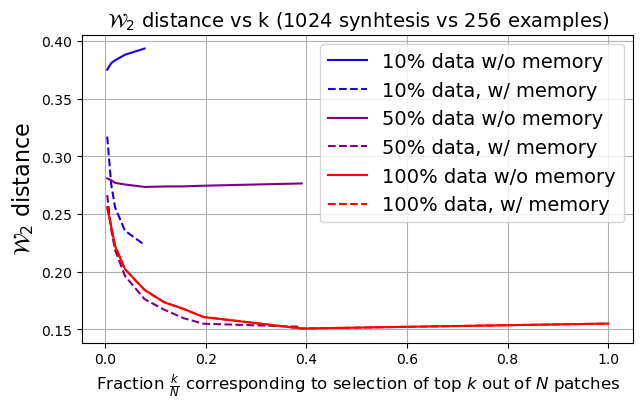

In [34]:
imsize = 256 # 128 # 256 # 512 : desired input/output resolution
imsize_out = 256 
BATCH_SIZE = 1 # should be one, we only want to optimize one image at a time here

data_rep = 'textures/'
im_name  =   'red_peppers_256.jpg' #'red_peppers_256.jpg' # cordes_256.png      radishes_256.jpg    red_peppers_256.jpg      pumkins_512.png     rafia.jpg           tiles.png
#im_name= 'pumkins_512.png'
save_rep = 'res/'


file_name = data_rep + im_name
 
## load image as a Tensor
img_torch = Tensor_load(file_name)[...]#,:64,:64]
#img_torch = F.interpolate(img_torch, size=(imsize, imsize), mode='bicubic') # resize to desired size
img_torch0 = torch.clone(img_torch)*2-1


patchsize=16
stride=16

P_exmpl = Patch_extraction(img_torch0,patchsize=patchsize,stride=stride) 

lrs=[.1,.5,1]
lk=[1,3,5,10,20,30,40,50,100,256]
base=4
plt.figure(figsize=(base*16/9,base))
for rs in tqdm(lrs):
    for memory in [0,1]:
        l=[]
        for k in lk:
            try:
                cost=0
                n_run=5
                for seed in range(n_run):
                    synth= Diffusion(img_torch0,rs=rs,T=50,k=k,patchsize=patchsize,stride=stride,octaves=1,size=(512,512),renoise=0.5,show=False,memory=memory,warmup=0,seed=seed) 
                    P_synth = Patch_extraction(synth,patchsize, stride)
                    D=(P_exmpl[0]**2).sum(0,keepdim=True).T-2*P_exmpl[0].T@P_synth[0]+(P_synth[0]**2).sum(0,keepdim=True)
                    a = torch.ones(P_exmpl.shape[-1]).cuda() / P_exmpl.shape[-1]  # uniform distribution over patches
                    b = torch.ones(P_synth.shape[-1]).cuda() / P_synth.shape[-1]  # uniform distribution over patches
                    P = ot.emd(a, b, D)  # exact OT plan
                    cost+=torch.sqrt(torch.sum(P * D)/P_synth.shape[-1]).cpu().numpy()
                l.append(cost/n_run)
            except:
                print(rs,k)
        plt.plot(np.array(lk[:len(l)])/P_exmpl.shape[-1],l,label='%d%% data%s'%(100*rs,', w/ memory' if memory else ' w/o memory'),linestyle='--' if memory else '-',color=(rs,0,1-rs))
    
plt.xlabel('Fraction $\\frac{k}{N}$ corresponding to selection of top $k$ out of $N$ patches',fontsize=12)
plt.ylabel('$\mathcal{W}_2$ distance',fontsize=16)
plt.title('$\mathcal{W}_2$ distance vs k (%d synhtesis vs %d examples)'%(P_synth.shape[-1],P_exmpl.shape[-1]),fontsize=14)
plt.legend(loc='best',fontsize=14)
plt.grid()
plt.savefig('./results/rs_k_memory.pdf',bbox_inches='tight')
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-10.311708..10.649178].


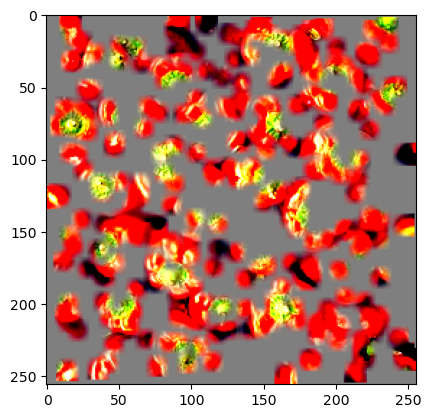

In [ ]:
# patch subsampling 
rs=.005
P_exmpl = Patch_extraction(img_torch0,patchsize=16,stride=1) # 1 x 3P^2 x HW/stride^2
N_subsampling=int(rs*P_exmpl.shape[-1])
I = torch.randperm(P_exmpl.shape[-1])#.to(device)
I = I[0:N_subsampling]
X = P_exmpl[:,:,I]
Y=P_exmpl*0
Y[:,:,I]=X
y=Patch_Average(Y, patchsize=16, stride=1, W=256, H=256, r=2, D=torch.ones((1, 1, N_subsampling)).cuda())
plt.imshow(y[0].permute(1, 2, 0).detach().cpu().numpy()/rs*.5+.5 )

cordes.png	   fabric.jpg  pumkins_512.png	 rafia.jpg	      tiles.png
_DSC0418_2048.jpg  paper.jpg   radishes_256.jpg  red_peppers_256.jpg


100%|██████████| 49/49 [00:02<00:00, 19.00it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.1920929e-07..1.0000001].


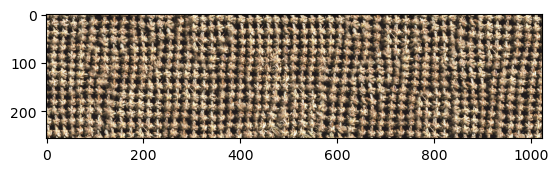

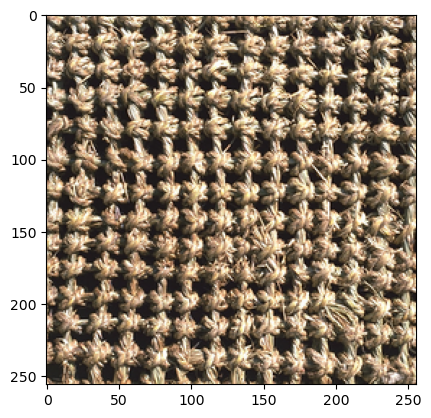

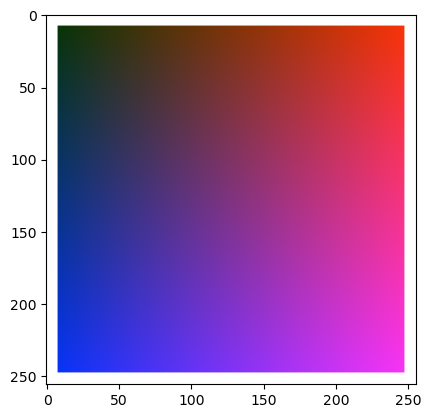

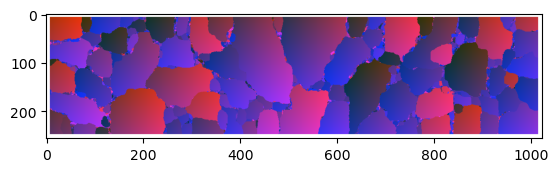

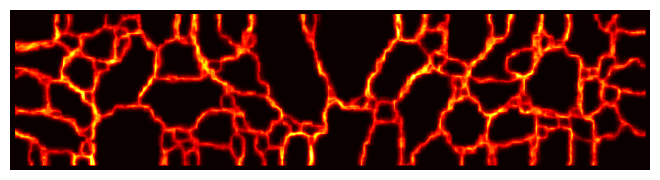

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0025336742..1.0000001].


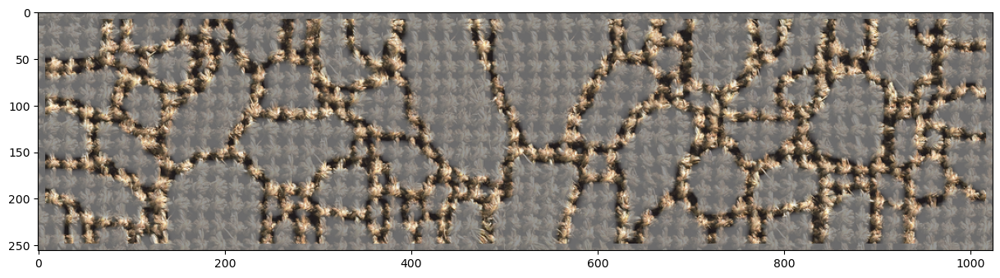

average L2 distance tensor(3.1888)


In [30]:
torch.manual_seed(0)

imsize = 256 # 128 # 256 # 512 : desired input/output resolution
imsize_out = 256 
BATCH_SIZE = 1 # should be one, we only want to optimize one image at a time here

data_rep = 'textures/'
! ls textures/
im_name  =   'red_peppers_256.jpg' #'red_peppers_256.jpg' # cordes_256.png      radishes_256.jpg    red_peppers_256.jpg      pumkins_512.png     rafia.jpg           tiles.png
H0,W0=256,256
save_rep = 'res/'

file_name = data_rep + im_name
file_name='comp/raad_256/raad8.png'
 
## load image as a Tensor
img_torch = Tensor_load(file_name)[...]#,:64,:64]
#img_torch = F.interpolate(img_torch, size=(imsize, imsize), mode='bicubic') # resize to desired size
img_torch0 = torch.clone(img_torch)*2-1

H,W=256,1024
patchsize=16
stride=4

synth= Diffusion(img_torch0,rs=.1,T=100,k=5,patchsize=patchsize,stride=stride,octaves=3,size=(H,W),renoise=0.5,warmup=10,memory=True,show=False) 


P_exmpl = Patch_extraction(img_torch0,patchsize=patchsize,stride=1)
P_synth = Patch_extraction(synth,patchsize=patchsize,stride=1)

N = P_synth.size(2)
ld=[]
lind=[]
for i in tqdm(range(N//5000+1)):


    X = P_exmpl[:,:,:] #.to(device) # 1 x d x Ns
    X = X.squeeze(0) # d x Ns

    X2 = (X**2).sum(0).unsqueeze(0) # 1 x Ns

    Y = P_synth[:,:,5000*i:5000*(i+1)].squeeze(0) # d x N

    Y2 = (Y**2).sum(0).unsqueeze(0) # squared norm : 1 x N
    D = Y2.transpose(1,0) - 2 * torch.matmul(Y.transpose(1,0),X) + X2 #N Ns
    Dnn,indnn=torch.min(D,dim=1)
    ld.append(Dnn.cpu())
    lind.append(indnn.cpu())


Dnn=torch.cat(ld)
indnn=torch.cat(lind)

y_grid = torch.linspace(0,1,H0) 
x_grid = torch.linspace(0,1,W0)
grid_y, grid_x = torch.meshgrid(y_grid, x_grid, indexing='ij')  # H_patches x W_patches
coords = torch.stack((grid_x,.2+0.*grid_x, grid_y), dim=0)

P_color0=Patch_extraction(coords,patchsize=patchsize,stride=1)
P_color=P_color0.view(3,patchsize,patchsize,P_color0.shape[-1])*0
P_color[:,patchsize//2,patchsize//2,:]=P_color0.view(3,patchsize,patchsize,P_color0.shape[-1])[:,patchsize//2,patchsize//2,:]
P_color=P_color.reshape(3*patchsize**2,-1)
P_warp=P_color[:,indnn]
warp=nn.Fold((H,W), patchsize, dilation=1, padding=0, stride=1)(P_warp)

P_dist=P_synth*0
P_dist=P_dist.view(3,patchsize,patchsize,P_dist.shape[-1])[:1]*0.
P_dist[0,patchsize//2,patchsize//2,:]=Dnn/Dnn.max()
dist=nn.Fold((H,W), patchsize, dilation=1, padding=0, stride=1)(P_dist.view(patchsize**2,-1))

rec=nn.Fold((H0,W0), patchsize, dilation=1, padding=0, stride=1)(P_color)

warp[...,:patchsize//2]=1.
warp[...,-patchsize//2:]=1.
warp[...,:patchsize//2,:]=1.
warp[...,-patchsize//2:,:]=1.

rec[...,:patchsize//2]=1.
rec[...,-patchsize//2:]=1.
rec[...,:patchsize//2,:]=1.
rec[...,-patchsize//2:,:]=1.

cutoff=0.2
mask=(dist/cutoff)
mask[dist>cutoff]=1
mask=.8*mask+.2

novelty=synth*mask
novelty=synth*mask


plt.imshow(synth[0].permute(1,2,0).cpu()*.5+.5)
plt.show()
imsave('fig_synth',synth)

plt.imshow(img_torch0[0].permute(1,2,0).cpu()*.5+.5)
plt.show()
imsave('fig_ref',img_torch0)

plt.imshow(rec.cpu().permute(1,2,0))
plt.show()
imsave('fig_gt_warp',rec*2-1)

plt.imshow(warp.cpu().permute(1,2,0))
plt.show()
imsave('fig_warp',warp*2-1)

plt.imshow(dist.cpu()[0],cmap='hot')
plt.axis('off')  # Hide axes
plt.tight_layout(pad=0)  # Remove padding around image
plt.savefig('results/fig_dist.png', bbox_inches='tight', pad_inches=0)
plt.show()

plt.figure(figsize=(15,15))
plt.imshow(novelty[0].permute(1,2,0).cpu()*.5+.5)
plt.show()
imsave('fig_novelty',novelty)

print('average L2 distance',torch.cat((Dnn[Dnn>0]**.5,torch.tensor([0]*((Dnn<=0).sum())))).mean())



cordes.png	 radishes_256.jpg  red_peppers_256.jpg
pumkins_512.png  rafia.jpg	   tiles.png
961 500
dists: tensor([-1.5259e-05,  7.4997e+01,  8.5794e+01])
mem: tensor([  0, 496, 479])
dists: tensor([ 0.0000, 74.9967, 85.7939])
mem: tensor([  0, 496, 479])
dists: tensor([ 0.0000, 74.9967, 85.7939])
mem: tensor([  0, 496, 479])
dists: tensor([ 0.0000, 74.9967, 85.7939])
mem: tensor([  0, 496, 479])
dists: tensor([ 0.0000, 74.9967, 85.7938])
mem: tensor([  0, 496, 479])
dists: tensor([ 0.0000, 74.9967, 85.7939])
mem: tensor([  0, 496, 479])
dists: tensor([ 0.0000, 74.9967, 85.7938])
mem: tensor([  0, 496, 479])
dists: tensor([ 0.0000, 74.9967, 85.7939])
mem: tensor([  0, 496, 479])
dists: tensor([ 0.0000, 74.9967, 85.7938])
mem: tensor([  0, 496, 479])
dists: tensor([ 0.0000, 74.9967, 85.7938])
mem: tensor([  0, 496, 479])


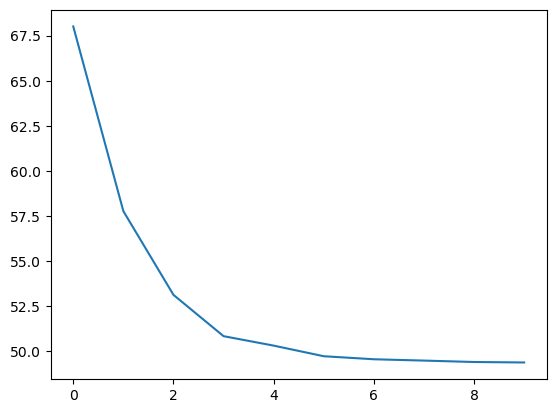

In [ ]:
#DB topk
imsize = 256 # 128 # 256 # 512 : desired input/output resolution
imsize_out = 256 
BATCH_SIZE = 1 # should be one, we only want to optimize one image at a time here

data_rep = 'textures/'
! ls textures/
im_name  =   'red_peppers_256.jpg' #'red_peppers_256.jpg' # cordes_256.png      radishes_256.jpg    red_peppers_256.jpg      pumkins_512.png     rafia.jpg           tiles.png
H0,W0=256,256
save_rep = 'res/'


file_name = data_rep + im_name
 
## load image as a Tensor
img_torch = Tensor_load(file_name)[...]#,:64,:64]
#img_torch = F.interpolate(img_torch, size=(imsize, imsize), mode='bicubic') # resize to desired size
img_torch0 = torch.clone(img_torch)*2-1
P_exmpl = Patch_extraction(img_torch0,patchsize=16,stride=8)
#P_synth= Patch_extraction(.5*img_torch0+.5*torch.randn(img_torch0.shape).cuda(),patchsize=16,stride=8)
P_synth=P_exmpl#+.5*torch.randn(P_exmpl.shape).cuda() # random init
## precomputation for NN search
k=3
mem=None
N = P_exmpl.size(2)
Ns = np.min([500,N])
print(N,Ns)
warmup=300
t0=.5

mem=None
l=[]
for _ in range(10):
    ## precomputation for NN search
    Ns = np.min([Ns,N])
    I = torch.randperm(N).cuda()#.to(device)
    I = I[0:Ns]
    X = P_exmpl[:,:,I] #.to(device) # 1 x d x Ns
    X = X.squeeze(0) # d x Ns

    #X=proj(X.T).T

    X2 = (X**2).sum(0).unsqueeze(0) # 1 x Ns

    ## NN SEARCH
    Y = P_synth.squeeze(0) # d x N

    #Y=proj(Y.T).T

    Y2 = (Y**2).sum(0).unsqueeze(0) # squared norm : 1 x N
    D = Y2.transpose(1,0) - 2 * torch.matmul(Y.transpose(1,0),X) + X2 #N Ns


    J,ind = torch.topk(-D,k=k,dim=1)
    topk = X[:,ind].unsqueeze(0) 
    #print('check',(topk-P_exmpl[:,:,torch.take(I,ind)]).abs().mean())
    #print(topk)

    if mem is None:
        top=topk
        #print(topk)
        mem=torch.take(I,ind)#I.cuda()[ind.view(-1)].view(ind.shape)
        #print(I.shape,ind.shape,mem.shape)
        #print(I,ind[0],mem[0])
        dists=-J
    else:

        X_mem=P_exmpl[:,:,mem]
        #print(X_mem)
        #print(X_mem.shape)
        X=X_mem[0].permute(2,0,1)
        #print(X.shape)
        Y=P_synth
        #print(Y.shape)
        X2 = (X**2).sum(1)
        Y2 = (Y**2).sum(1)
        D_mem=(Y2+X2-2*(X*Y).sum(1)).T

        Dcat=torch.cat((D_mem,-J),dim=1)
        indcat=torch.cat((mem,torch.take(I,ind)),dim=1)
        #print(Dcat[:,:k].cpu().mean())
        #Dcat= [ii for n,ii,jj in enumerate(zip(Dcat,indcat)) if jj not in indcat[:n]]
        #indcat= [jj for n,jj in enumerate(indcat) if jj not in indcat[:n]]

        sorted_indcat,sorted_indcat_ind=torch.sort(indcat,dim=1)

        del_mask = torch.zeros_like(indcat, dtype=torch.bool)
        del_mask[:,1:] = (sorted_indcat[:,1:] == sorted_indcat[:,:-1])
        
        _,inv_sorted_indcat_ind=torch.sort(sorted_indcat_ind,dim=1)
        del_mask=torch.take_along_dim(del_mask,inv_sorted_indcat_ind,dim=1)
        
        Dcat[del_mask]=torch.inf


        Dcat,selected=torch.sort(Dcat,dim=-1)
        #print('dcat inf',Dcat[0])
        Dcat=Dcat[:,:k]
        new_mem=torch.take_along_dim(indcat,selected[:,:k],dim=1) # doesn t avoid ducplicates, gives double mass to duplicates, allows stacking n over time :/
        topk=torch.take_along_dim(torch.cat((X_mem,topk),dim=-1),selected[:,:k].unsqueeze(0).unsqueeze(0),dim=-1)

        top=topk
        dists=Dcat
        mem=new_mem


    l.append(dists[:,:k].cpu().mean())
    print('dists:',dists[0].cpu())
    print('mem:',mem[0].cpu())
plt.plot(l)

In [ ]:
# save image
#img_torch = F.interpolate(img_torch0, size=(synth.size(2),synth.size(3)), scale_factor=None, mode='bicubic', align_corners=False).clamp(0,1)
#out = torch.cat((img_torch*.5+.5,synth*.5+.5), 3) # put in and out side by side
#out = out.squeeze(0).permute(1, 2, 0).cpu().numpy()
#plt.imsave('compare.png', out)

out = img_torch0.squeeze(0).permute(1, 2, 0).cpu().numpy()*.5+.5
plt.imsave('in.png', out)
out = synth.squeeze(0).permute(1, 2, 0).cpu().numpy()*.5+.5
plt.imsave('out.png', out.clip(0,1))


In [ ]:
if False: # top k only for memory
    def Patch_topk(P_exmpl, P_synth, N_subsampling, k=10,mem=None,proj=None,I=None) :
        N = P_exmpl.size(2)
        
        ## precomputation for NN search
        Ns = np.min([N_subsampling,N])
        if I is None:
            I = torch.randperm(N)#.to(device)
            I = I[0:Ns]
        
        X = P_exmpl[:,:,I] #.to(device) # 1 x d x Ns
        X = X.squeeze(0) # d x Ns
        Y = P_synth.squeeze(0) # d x N
        D = (Y**2).sum(0).view(-1,1) - 2 * torch.matmul(Y.transpose(1,0),X) + (X**2).sum(0).unsqueeze(0) #N Ns


        Ds,ind = torch.sort(D,dim=1)#torch.topk(-D,k=k,dim=1)
        topk = X[:,ind].unsqueeze(0) # now takes all rather than top k
        I=I.cuda()
        if mem is None:
            mem=torch.take(I,ind[:,:k])
            dists=Ds
        else:

            X_mem=P_exmpl[:,:,mem]
            X_mem_reshaped=X_mem[0].permute(2,0,1)
            Y=P_synth
            X2 = (X_mem_reshaped**2).sum(1)
            Y2 = (Y**2).sum(1)
            D_mem=(Y2+X2-2*(X_mem_reshaped*Y).sum(1)).T

            Dcat=torch.cat((D_mem,Ds),dim=1)
            indcat=torch.cat((mem,torch.take(I,ind)),dim=1)
            
            sorted_indcat,sorted_indcat_ind=torch.sort(indcat,dim=1)

            del_mask = torch.zeros_like(indcat, dtype=torch.bool)
            del_mask[:,1:] = (sorted_indcat[:,1:] == sorted_indcat[:,:-1])
            
            _,inv_sorted_indcat_ind=torch.sort(sorted_indcat_ind,dim=1)
            del_mask=torch.take_along_dim(del_mask,inv_sorted_indcat_ind,dim=1)
            Dcat[del_mask]=torch.inf


            _,dists_ind=torch.sort(Dcat,dim=-1)
            #Dcat=Dcat[:,:k]
            new_mem=torch.take_along_dim(indcat,dists_ind[:,:k],dim=1) # doesn t avoid ducplicates, gives double mass to duplicates, allows stacking n over time :/

            topk=torch.cat((X_mem,topk),dim=-1)#torch.take_along_dim(torch.cat((X_mem,topk),dim=-1),dists_ind[:,:].unsqueeze(0).unsqueeze(0),dim=-1)
            dists=Dcat
            mem=new_mem
        #print(mem.shape)
            
        return topk, dists, mem


Compare with Unet approximation of the flow


In [10]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcol
import matplotlib.cm as cm

cm1 = mcol.LinearSegmentedColormap.from_list("MyCmapName",["b","r"])
cnorm = mcol.Normalize(vmin=0,vmax=1)
cpick = cm.ScalarMappable(norm=cnorm,cmap=cm1)
cpick.set_array([])




def train_flow_net(img_clean, model, device='cuda', epochs=30000,load=False,save_name='flow_model'):
    T=50
    data_rep = 'textures/'
    im_name  =  'red_peppers_256.jpg' # cordes_256.png      radishes_256.jpg    red_peppers_256.jpg      pumkins_512.png     rafia.jpg           tiles.png
    file_name = data_rep + im_name
    img_torch = Tensor_load(file_name)[...]
    img_torch0 = torch.clone(img_torch)*2-1
    mu,sigma=img_torch0.mean(),img_torch0.std()
    noise_plot=torch.randn(1,3,128,128).cuda()
    synth_patch=Diffusion(img_torch0,rs=1,T=T,k=10,patchsize=16,stride=2,octaves=1,size=(64,64),renoise=0.5,warmup=0,memory=True,noise=noise_plot,show=False) 
    l=[]
    times=[]
    model = model.to(device)
    if load:
        model.load_state_dict(torch.load('flow_model.pth'))
    model.train()
    img_clean = img_clean.to(device)
    
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
    loss_fn = nn.MSELoss()
    bs=4
    for epoch in tqdm(range(epochs)):
        t = torch.rand((bs,1,1,1), device=device)  # Random time for each epoch
        # Generate noisy input
        noise = torch.randn(bs,*img_clean.shape[1:]).cuda()
        img_noisy = img_clean*t + noise*(1-t)
        # Ground-truth flow
        true_flow = img_clean - noise
        
        # Predict flow
        pred_flow = model(img_noisy,t)


        loss = loss_fn(true_flow, pred_flow)

        optimizer.zero_grad()
        loss.backward()
        l.append(loss.detach().cpu().item())
        times.append(t.detach().cpu().mean().item())
        optimizer.step()

        if (epoch+1) % 5000 == 0:
            torch.save(model.state_dict(), '%s.pth'%save_name)
            
    torch.save(model.state_dict(), '%s.pth'%save_name)
    fig, ax = plt.subplots()
    sc=ax.scatter(torch.arange(len(l))-torch.arange(len(l))*(1-torch.tensor(times))*.1,torch.tensor(l),color=[(1-t,0,t,.2) for t in times], s=50)
    plt.colorbar(cpick, ax=ax, label='Time')
    plt.yscale('log')
    plt.show()

    with torch.no_grad():
        x = noise_plot*1.
        times_=torch.linspace(0, 1, steps=T+1).cuda()**2
        for it in range(T):
            t=times_[it]
            t = t.to(device).unsqueeze(0)
            flow = flow_model(x,t.view(1,1,1,1))
            x=x+flow*(times_[it+1]-times_[it])

    synth_nn = x*sigma+mu
    Tensor_display(synth_nn, synth_patch)

data_rep = 'textures/'
im_name  =  'red_peppers_256.jpg' # cordes_256.png      radishes_256.jpg    red_peppers_256.jpg      pumkins_512.png     rafia.jpg           tiles.png
file_name = data_rep + im_name
img_torch = Tensor_load(file_name)[...]
img_torch0 = torch.clone(img_torch)*2-1
mu,sigma=img_torch0.mean(),img_torch0.std()

flow_model = TimeConditionedUNet(base_channels=128)

#train_flow_net((img_torch0-mu)/sigma , flow_model,load=True,epochs=100000)


/tmp/ipykernel_5384/589118743.py:12: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  flow_model.load_state_dict(torch.load('flow_model.pth', map_location='cuda'))


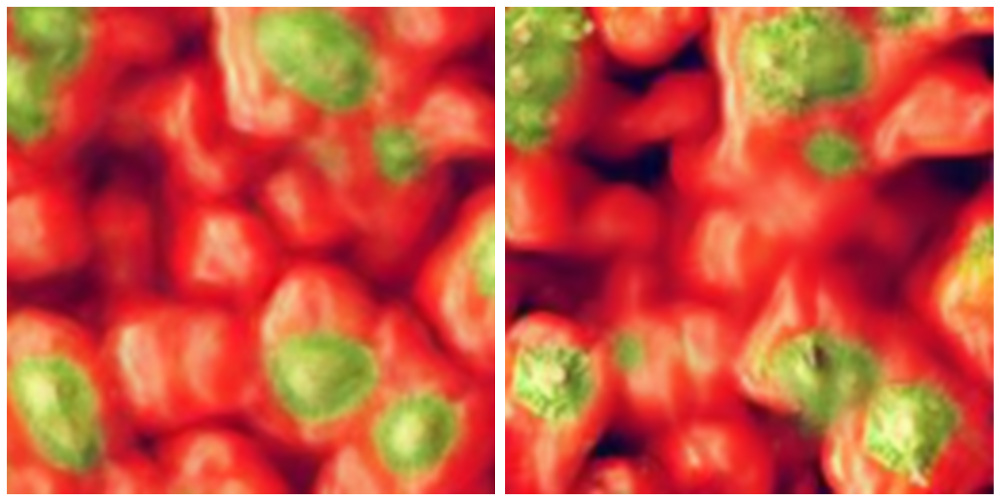

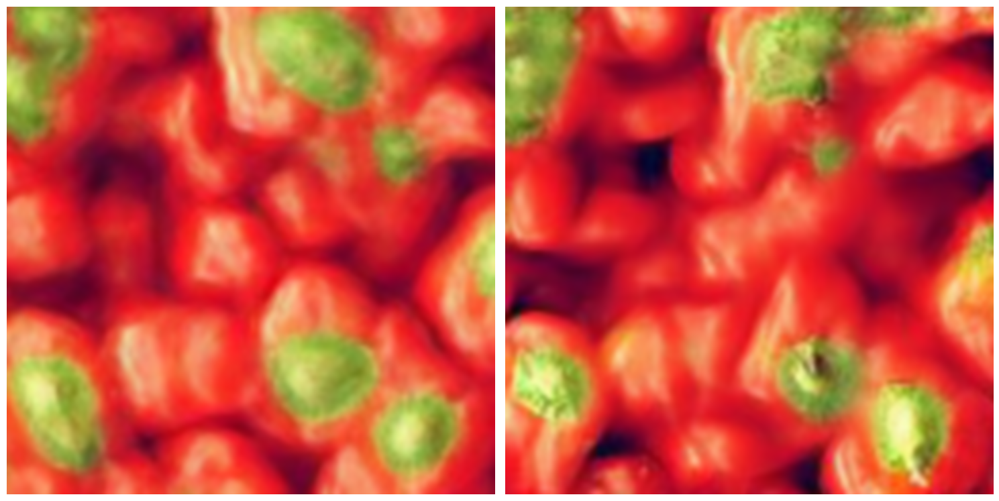

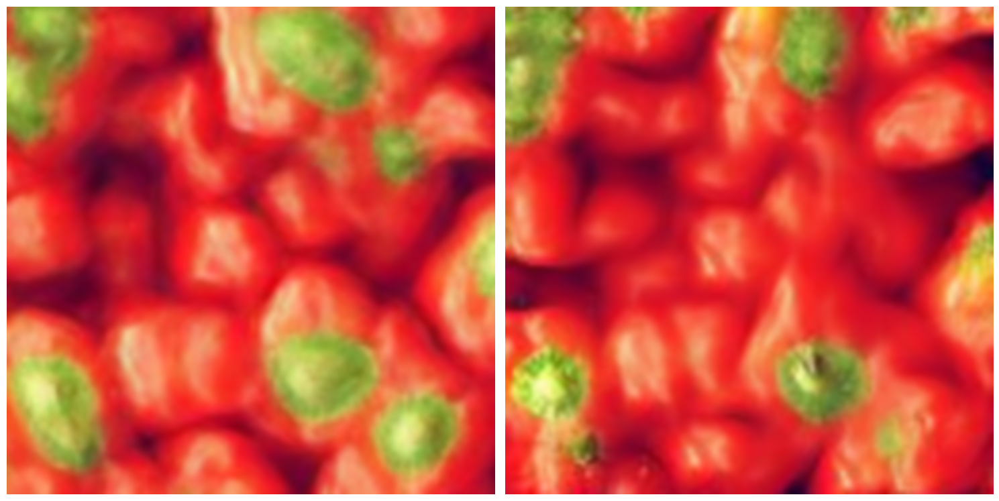

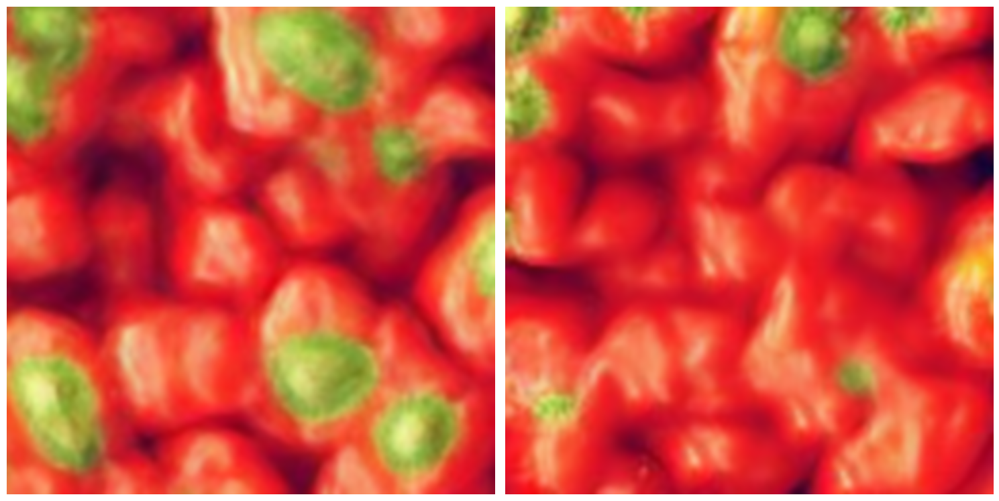

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-15.018975..2.737355].


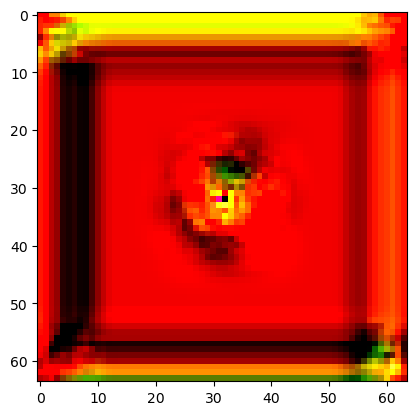

In [18]:
# receptive field

data_rep = 'textures/'
im_name  =  'red_peppers_256.jpg' # cordes_256.png      radishes_256.jpg    red_peppers_256.jpg      pumkins_512.png     rafia.jpg           tiles.png
file_name = data_rep + im_name
img_torch = Tensor_load(file_name)[...]
img_torch0 = torch.clone(img_torch)*2-1
mu,sigma=img_torch0.mean(),img_torch0.std()

flow_model = TimeConditionedUNet(base_channels=128)

flow_model.load_state_dict(torch.load('flow_model.pth', map_location='cuda'))
flow_model.eval().cuda()

torch.manual_seed(0)
T=50
noise_nn=torch.randn(1,3,256,256).cuda()
noise=noise_nn[...,64:64+128,64:64+128]
with torch.no_grad():
      # or from your diffusion process
    x = noise_nn*1.
    times=torch.linspace(0, 1, steps=T+1).cuda()**1
    for it in range(T):
        t=times[it]
        t = t.to(device).unsqueeze(0)
        flow = flow_model(x,t.view(1,1,1,1))
        x=x+flow*(times[it+1]-times[it])

synth_nn = x*sigma+mu
synth_nn=synth_nn[...,64:64+128,64:64+128]
imsave('synth_nn',synth_nn)

lk=[3,10,50,100]
ls=[]
for k in lk:
    synth_patch=Diffusion(img_torch0,rs=1,T=T,k=k,patchsize=16,stride=2,octaves=1,size=(128,128),renoise=0.5,warmup=0,memory=True,noise=noise,show=False,spotsize=1/4) 
    ls.append(synth_patch)
    imsave('synth_patch_k_%d'%k,synth_patch)
    Tensor_display(synth_nn, synth_patch)
x0=torch.zeros(1,3,64,64).cuda()
x0[:,:,32,32]=10
plt.imshow(flow_model(x0,torch.tensor(.5).view(1,1).cuda())[0].permute(1, 2, 0).detach().cpu().numpy())




In [15]:
#novelty nifty vs TO

torch.manual_seed(0)

file_name='./comp/raad_256/raad1.png'
img_torch0 = Tensor_load(file_name)[...]*2-1

file_name='./comp/raad1/nifty/0.png'
synth1 = Tensor_load(file_name)[...]*2-1

file_name='./comp/raad1/kwatra_patch/0.png'
synth2 = Tensor_load(file_name)[...]*2-1

patchsize=16
H0,W0=256,256
H,W=512,512

P_exmpl = Patch_extraction(img_torch0,patchsize=patchsize,stride=1)
for synth,method in zip([synth1,synth2],['nifty','kwatra']):
    P_synth = Patch_extraction(synth,patchsize=patchsize,stride=1)

    N = P_synth.size(2)
    ld=[]
    lind=[]
    for i in tqdm(range(N//5000+1)):


        X = P_exmpl[:,:,:] #.to(device) # 1 x d x Ns
        X = X.squeeze(0) # d x Ns

        X2 = (X**2).sum(0).unsqueeze(0) # 1 x Ns

        Y = P_synth[:,:,5000*i:5000*(i+1)].squeeze(0) # d x N

        Y2 = (Y**2).sum(0).unsqueeze(0) # squared norm : 1 x N
        D = Y2.transpose(1,0) - 2 * torch.matmul(Y.transpose(1,0),X) + X2 #N Ns
        Dnn,indnn=torch.min(D,dim=1)
        ld.append(Dnn.cpu())
        lind.append(indnn.cpu())


    Dnn=torch.cat(ld)
    indnn=torch.cat(lind)

    y_grid = torch.linspace(0,1,H0) 
    x_grid = torch.linspace(0,1,W0)
    grid_y, grid_x = torch.meshgrid(y_grid, x_grid, indexing='ij')  # H_patches x W_patches
    coords = torch.stack((grid_x,.2+0.*grid_x, grid_y), dim=0)

    P_color0=Patch_extraction(coords,patchsize=patchsize,stride=1)
    P_color=P_color0.view(3,patchsize,patchsize,P_color0.shape[-1])*0
    P_color[:,patchsize//2,patchsize//2,:]=P_color0.view(3,patchsize,patchsize,P_color0.shape[-1])[:,patchsize//2,patchsize//2,:]
    P_color=P_color.reshape(3*patchsize**2,-1)
    P_warp=P_color[:,indnn]
    warp=nn.Fold((H,W), patchsize, dilation=1, padding=0, stride=1)(P_warp)

    P_dist=P_synth*0
    P_dist=P_dist.view(3,patchsize,patchsize,P_dist.shape[-1])[:1]*0.
    P_dist[0,patchsize//2,patchsize//2,:]=Dnn/Dnn.max()
    dist=nn.Fold((H,W), patchsize, dilation=1, padding=0, stride=1)(P_dist.view(patchsize**2,-1))

    rec=nn.Fold((H0,W0), patchsize, dilation=1, padding=0, stride=1)(P_color)

    warp[...,:patchsize//2]=1.
    warp[...,-patchsize//2:]=1.
    warp[...,:patchsize//2,:]=1.
    warp[...,-patchsize//2:,:]=1.

    rec[...,:patchsize//2]=1.
    rec[...,-patchsize//2:]=1.
    rec[...,:patchsize//2,:]=1.
    rec[...,-patchsize//2:,:]=1.

    cutoff=0.2
    mask=(dist/cutoff)
    mask[dist>cutoff]=1
    mask=.8*mask+.2

    novelty=synth*mask
    novelty=synth*mask

    if False:
        plt.imshow(synth[0].permute(1,2,0).cpu()*.5+.5)
        plt.show()
        imsave('fig_synth',synth)

        plt.imshow(img_torch0[0].permute(1,2,0).cpu()*.5+.5)
        plt.show()
        imsave('fig_ref',img_torch0)

        plt.imshow(rec.cpu().permute(1,2,0))
        plt.show()
        imsave('fig_gt_warp',rec*2-1)

        plt.imshow(warp.cpu().permute(1,2,0))
        plt.show()
        imsave('fig_warp',warp*2-1)

        plt.imshow(dist.cpu()[0],cmap='hot')
        plt.axis('off')  # Hide axes
        plt.tight_layout(pad=0)  # Remove padding around image
        plt.savefig('results/fig_dist.png', bbox_inches='tight', pad_inches=0)
        plt.show()

    #plt.figure(figsize=(15,15))
    #plt.imshow(torchvision.transforms.CenterCrop(128)(novelty)[0].permute(1,2,0).cpu()*.5+.5)
    #plt.show()
    imsave('novelty_%s'%method,torchvision.transforms.CenterCrop(128)(novelty))

    print('average L2 distance',torch.cat((Dnn[Dnn>0]**.5,torch.tensor([0]*((Dnn<=0).sum())))).mean())
imsave('novelty_%s'%'gt',torchvision.transforms.CenterCrop(128)(img_torch0))


100%|██████████| 50/50 [00:02<00:00, 18.94it/s]


average L2 distance tensor(1.0740)


100%|██████████| 50/50 [00:02<00:00, 19.08it/s]


average L2 distance tensor(1.0499)


100%|██████████| 20000/20000 [57:42<00:00,  5.78it/s]


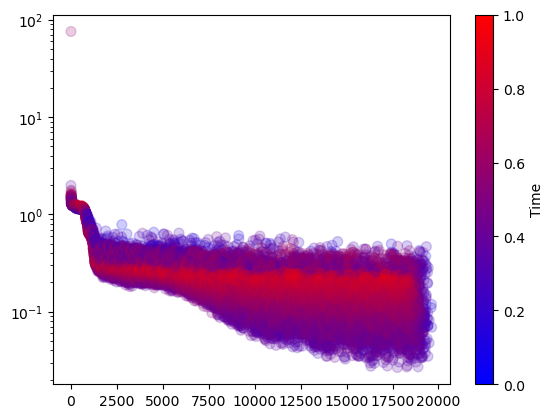

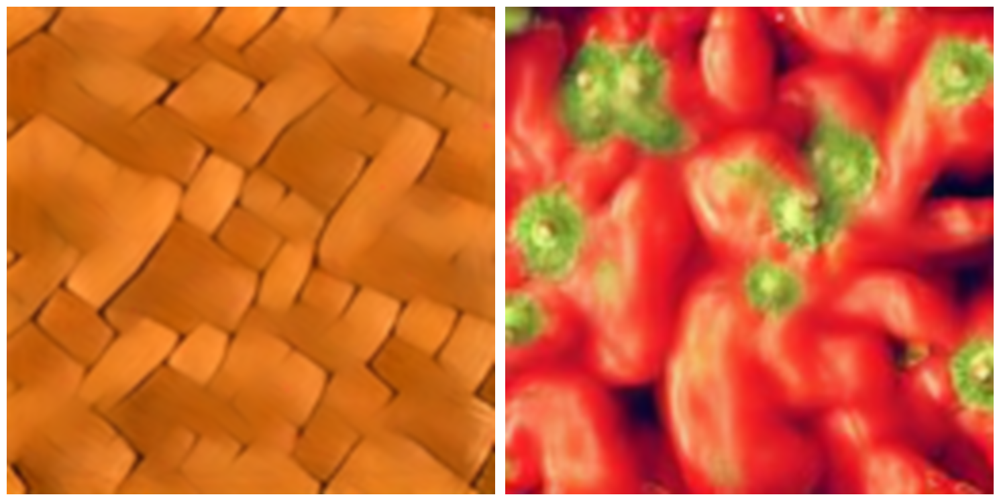

/tmp/ipykernel_5384/2877991780.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  flow_model.load_state_dict(torch.load('raad%d.pth'%j, map_location='cuda'))
100%|████████

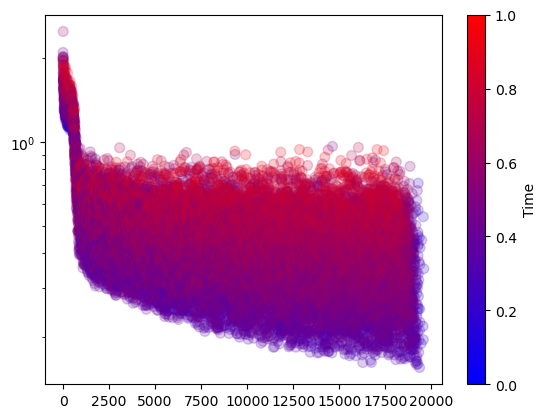

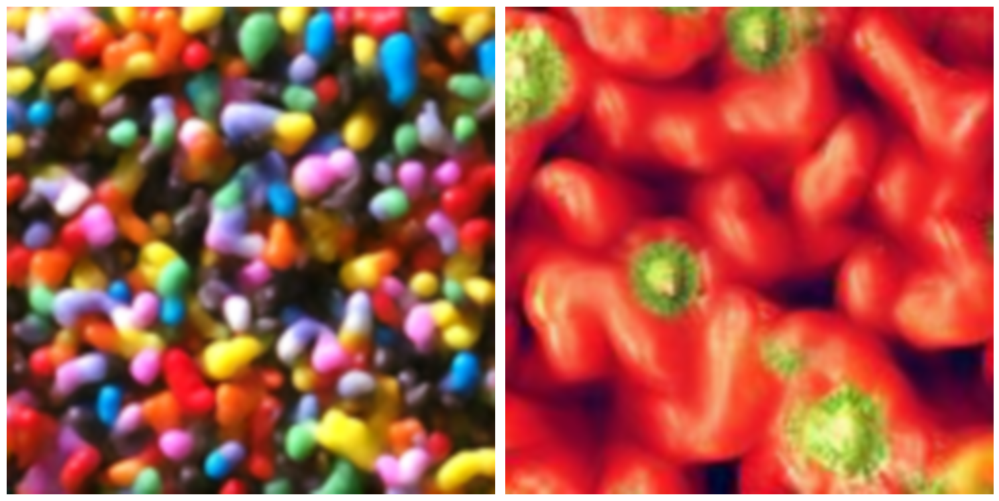

100%|██████████| 20000/20000 [57:34<00:00,  5.79it/s]


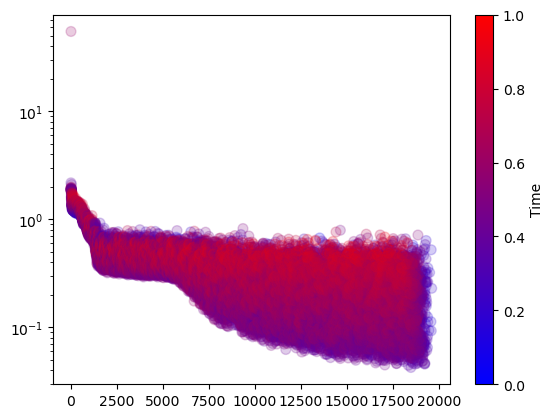

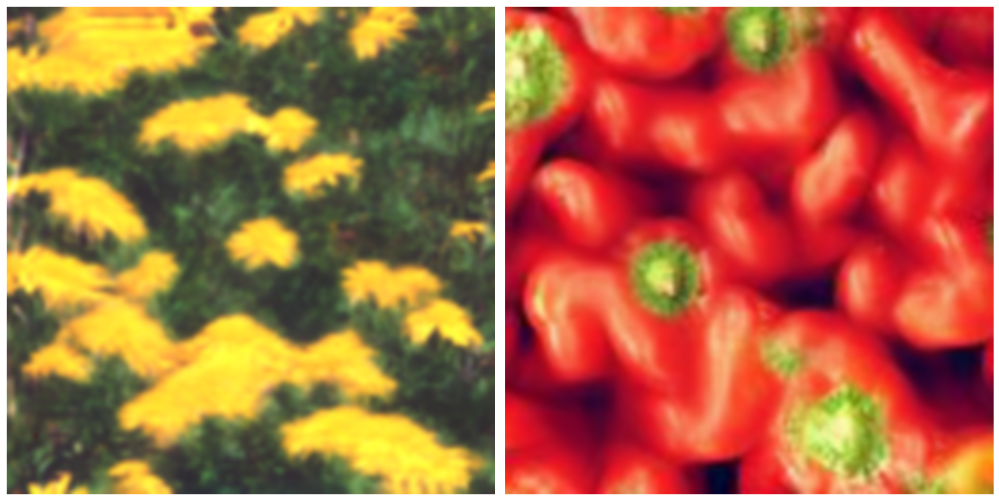

100%|██████████| 20000/20000 [57:41<00:00,  5.78it/s]


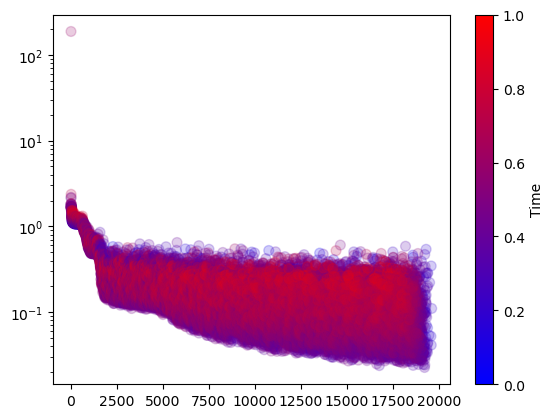

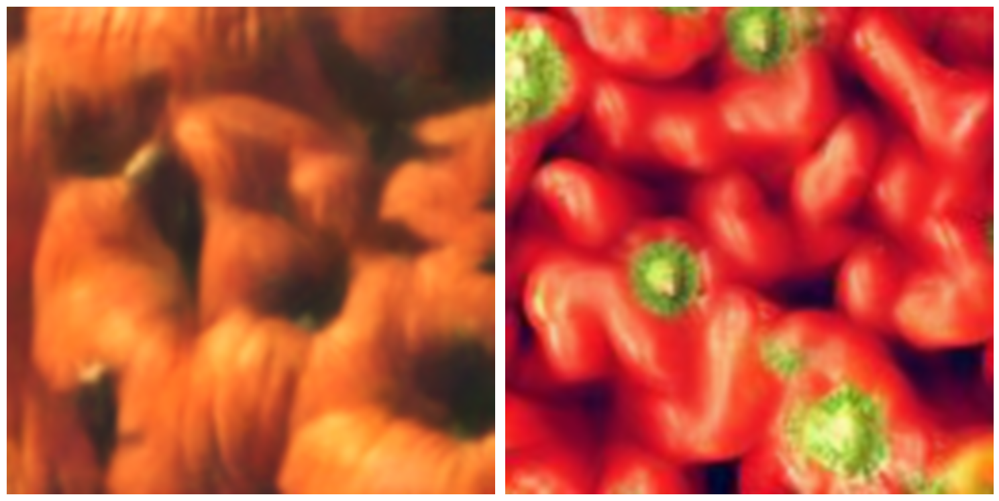

In [ ]:
# raad nn

output_size = 512
t0 = time.time()
for j in range(1,13):
    im_name='raad%d.png'%j
    path=os.path.join('./comp/raad_256/', im_name)
    img_torch = Tensor_load(path)[...]
    img_torch0 = torch.clone(img_torch)*2-1
    os.makedirs('./comp/%s/FM'%(im_name.split('.')[0]), exist_ok=True)


    mu,sigma=img_torch0.mean(),img_torch0.std()




    flow_model = TimeConditionedUNet(base_channels=128)

    train_flow_net((img_torch0-mu)/sigma , flow_model,load=False,epochs=20000,save_name='raad%d'%j)

    flow_model.load_state_dict(torch.load('raad%d.pth'%j, map_location='cuda'))
    flow_model.eval().cuda()


    for i in range(10):
        torch.manual_seed(i)

        T=100
        noise_nn=torch.randn(1,3,512,512).cuda()
        noise=noise_nn[...,64:64+128,64:64+128]
        with torch.no_grad():
            x = noise_nn*1.
            times=torch.linspace(0, 1, steps=T+1).cuda()**1
            for it in range(T):
                t=times[it]
                t = t.to(device).unsqueeze(0)
                flow = flow_model(x,t.view(1,1,1,1))
                x=x+flow*(times[it+1]-times[it])

        synth_nn = x*sigma+mu
        #synth_nn=synth_nn[...,64:64+128,64:64+128]
        imsave('../comp/%s/FM/%d'%(im_name.split('.')[0],i),synth_nn)
         

In [13]:
from einops import rearrange, reduce, repeat
from einops.layers.torch import Rearrange
from torch.nn import Module, ModuleList
import torch.nn as nn
from functools import partial



def exists(x):
    return x is not None

def default(val, d):
    if exists(val):
        return val
    return d() if callable(d) else d

def cast_tuple(t, length = 1):
    if isinstance(t, tuple):
        return t
    return ((t,) * length)

def divisible_by(numer, denom):
    return (numer % denom) == 0

def identity(t, *args, **kwargs):
    return t

def cycle(dl):
    while True:
        for data in dl:
            yield data

def has_int_squareroot(num):
    return (math.sqrt(num) ** 2) == num

def num_to_groups(num, divisor):
    groups = num // divisor
    remainder = num % divisor
    arr = [divisor] * groups
    if remainder > 0:
        arr.append(remainder)
    return arr

def convert_image_to_fn(img_type, image):
    if image.mode != img_type:
        return image.convert(img_type)
    return image

# normalization functions

def normalize_to_neg_one_to_one(img):
    return img * 2 - 1

def unnormalize_to_zero_to_one(t):
    return (t + 1) * 0.5

# small helper modules

def Upsample(dim, dim_out = None):
    return nn.Sequential(
        nn.Upsample(scale_factor = 2, mode = 'nearest'),
        nn.Conv2d(dim, default(dim_out, dim), 3, padding = 1)
    )

def Downsample(dim, dim_out = None):
    return nn.Sequential(
        Rearrange('b c (h p1) (w p2) -> b (c p1 p2) h w', p1 = 2, p2 = 2),
        nn.Conv2d(dim * 4, default(dim_out, dim), 1)
    )

class RMSNorm(Module):
    def __init__(self, dim):
        super().__init__()
        self.scale = dim ** 0.5
        self.g = nn.Parameter(torch.ones(1, dim, 1, 1))

    def forward(self, x):
        return F.normalize(x, dim = 1) * self.g * self.scale

# sinusoidal positional embeds

class SinusoidalPosEmb(Module):
    def __init__(self, dim, theta = 10000):
        super().__init__()
        self.dim = dim
        self.theta = theta

    def forward(self, x):
        device = x.device
        half_dim = self.dim // 2
        emb = math.log(self.theta) / (half_dim - 1)
        emb = torch.exp(torch.arange(half_dim, device=device) * -emb)
        emb = x[:, None] * emb[None, :]
        emb = torch.cat((emb.sin(), emb.cos()), dim=-1)
        return emb

class RandomOrLearnedSinusoidalPosEmb(Module):
    """ following @crowsonkb 's lead with random (learned optional) sinusoidal pos emb """
    """ https://github.com/crowsonkb/v-diffusion-jax/blob/master/diffusion/models/danbooru_128.py#L8 """

    def __init__(self, dim, is_random = False):
        super().__init__()
        assert divisible_by(dim, 2)
        half_dim = dim // 2
        self.weights = nn.Parameter(torch.randn(half_dim), requires_grad = not is_random)

    def forward(self, x):
        x = rearrange(x, 'b -> b 1')
        freqs = x * rearrange(self.weights, 'd -> 1 d') * 2 * math.pi
        fouriered = torch.cat((freqs.sin(), freqs.cos()), dim = -1)
        fouriered = torch.cat((x, fouriered), dim = -1)
        return fouriered

# building block modules

class Block(Module):
    def __init__(self, dim, dim_out, dropout = 0.):
        super().__init__()
        self.proj = nn.Conv2d(dim, dim_out, 3, padding = 1)
        self.norm = RMSNorm(dim_out)
        self.act = nn.SiLU()
        self.dropout = nn.Dropout(dropout)

    def forward(self, x, scale_shift = None):
        x = self.proj(x)
        x = self.norm(x)

        if exists(scale_shift):
            scale, shift = scale_shift
            x = x * (scale + 1) + shift

        x = self.act(x)
        return self.dropout(x)

class ResnetBlock(Module):
    def __init__(self, dim, dim_out, *, time_emb_dim = None, dropout = 0.):
        super().__init__()
        self.mlp = nn.Sequential(
            nn.SiLU(),
            nn.Linear(time_emb_dim, dim_out * 2)
        ) if exists(time_emb_dim) else None

        self.block1 = Block(dim, dim_out, dropout = dropout)
        self.block2 = Block(dim_out, dim_out)
        self.res_conv = nn.Conv2d(dim, dim_out, 1) if dim != dim_out else nn.Identity()

    def forward(self, x, time_emb = None):

        scale_shift = None
        if exists(self.mlp) and exists(time_emb):
            time_emb = self.mlp(time_emb)
            time_emb = rearrange(time_emb, 'b c -> b c 1 1')
            scale_shift = time_emb.chunk(2, dim = 1)

        h = self.block1(x, scale_shift = scale_shift)

        h = self.block2(h)

        return h + self.res_conv(x)

class LinearAttention(Module):
    def __init__(
        self,
        dim,
        heads = 4,
        dim_head = 32,
        num_mem_kv = 4
    ):
        super().__init__()
        self.scale = dim_head ** -0.5
        self.heads = heads
        hidden_dim = dim_head * heads

        self.norm = RMSNorm(dim)

        self.mem_kv = nn.Parameter(torch.randn(2, heads, dim_head, num_mem_kv))
        self.to_qkv = nn.Conv2d(dim, hidden_dim * 3, 1, bias = False)

        self.to_out = nn.Sequential(
            nn.Conv2d(hidden_dim, dim, 1),
            RMSNorm(dim)
        )

    def forward(self, x):
        b, c, h, w = x.shape

        x = self.norm(x)

        qkv = self.to_qkv(x).chunk(3, dim = 1)
        q, k, v = map(lambda t: rearrange(t, 'b (h c) x y -> b h c (x y)', h = self.heads), qkv)

        mk, mv = map(lambda t: repeat(t, 'h c n -> b h c n', b = b), self.mem_kv)
        k, v = map(partial(torch.cat, dim = -1), ((mk, k), (mv, v)))

        q = q.softmax(dim = -2)
        k = k.softmax(dim = -1)

        q = q * self.scale

        context = torch.einsum('b h d n, b h e n -> b h d e', k, v)

        out = torch.einsum('b h d e, b h d n -> b h e n', context, q)
        out = rearrange(out, 'b h c (x y) -> b (h c) x y', h = self.heads, x = h, y = w)
        return self.to_out(out)

class Zero(Module):
    def __init__(self):
        super().__init__()

    def forward(self, x):
        return 0.
# model

class FourierUnit(nn.Module):

    def __init__(self, in_channels, out_channels, groups=1, spatial_scale_factor=None, spatial_scale_mode='bilinear',
                 spectral_pos_encoding=False, use_se=False, se_kwargs=None, ffc3d=False, fft_norm='ortho'):
        # bn_layer not used
        super(FourierUnit, self).__init__()
        self.groups = groups

        self.conv_layer = torch.nn.Conv2d(in_channels=in_channels * 2 + (2 if spectral_pos_encoding else 0),
                                          out_channels=out_channels * 2,
                                          kernel_size=1, stride=1, padding=0, groups=self.groups, bias=False)
        self.bn = torch.nn.BatchNorm2d(out_channels * 2)
        self.relu = torch.nn.ReLU(inplace=True)

        # squeeze and excitation block


        self.spatial_scale_factor = spatial_scale_factor
        self.spatial_scale_mode = spatial_scale_mode
        self.spectral_pos_encoding = spectral_pos_encoding
        self.ffc3d = ffc3d
        self.fft_norm = fft_norm

    def forward(self, x):
        batch = x.shape[0]

        if self.spatial_scale_factor is not None:
            orig_size = x.shape[-2:]
            x = F.interpolate(x, scale_factor=self.spatial_scale_factor, mode=self.spatial_scale_mode, align_corners=False)

        r_size = x.size()
        # (batch, c, h, w/2+1, 2)
        fft_dim = (-3, -2, -1) if self.ffc3d else (-2, -1)
        ffted = torch.fft.rfftn(x, dim=fft_dim, norm=self.fft_norm).type(torch.complex64)
        ffted = torch.stack((ffted.real, ffted.imag), dim=-1)
        ffted = ffted.permute(0, 1, 4, 2, 3).contiguous()  # (batch, c, 2, h, w/2+1)
        ffted = ffted.view((batch, -1,) + ffted.size()[3:])

        if self.spectral_pos_encoding:
            height, width = ffted.shape[-2:]
            coords_vert = torch.linspace(0, 1, height)[None, None, :, None].expand(batch, 1, height, width).to(ffted)
            coords_hor = torch.linspace(0, 1, width)[None, None, None, :].expand(batch, 1, height, width).to(ffted)
            ffted = torch.cat((coords_vert, coords_hor, ffted), dim=1)


        ffted = self.conv_layer(ffted)  # (batch, c*2, h, w/2+1)
        ffted = self.relu(self.bn(ffted))

        ffted = ffted.view((batch, -1, 2,) + ffted.size()[2:]).permute(
            0, 1, 3, 4, 2).contiguous()  # (batch,c, t, h, w/2+1, 2)
        ffted = torch.complex(ffted[..., 0], ffted[..., 1]).to(torch.complex64)

        ifft_shape_slice = x.shape[-3:] if self.ffc3d else x.shape[-2:]
        output = torch.fft.irfftn(ffted, s=ifft_shape_slice, dim=fft_dim, norm=self.fft_norm)

        if self.spatial_scale_factor is not None:
            output = F.interpolate(output, size=orig_size, mode=self.spatial_scale_mode, align_corners=False)

        return output


class Unet(Module):
    def __init__(
        self,
        dim,
        init_dim = None,
        out_dim = None,
        dim_mults = (1, 2, 4, 4),
        channels = 3,
        self_condition = False,
        learned_variance = False,
        learned_sinusoidal_cond = False,
        random_fourier_features = False,
        learned_sinusoidal_dim = 16,
        sinusoidal_pos_emb_theta = 10000,
        dropout = 0.,
        attn_dim_head = 32,
        attn_heads = 4,
        full_attn = None,    # defaults to full attention only for inner most layer
        flash_attn = False,
        mid_attn=False,
        mid_fourier=False):
        super().__init__()

        # determine dimensions

        self.channels = channels
        self.self_condition = self_condition
        input_channels = channels * (2 if self_condition else 1)

        init_dim = default(init_dim, dim)
        self.init_conv = nn.Conv2d(input_channels, init_dim, 7, padding = 3)

        dims = [init_dim, *map(lambda m: dim * m, dim_mults)]
        in_out = list(zip(dims[:-1], dims[1:]))

        # time embeddings

        time_dim = dim * 4

        self.random_or_learned_sinusoidal_cond = learned_sinusoidal_cond or random_fourier_features
        self.mid_fourier=mid_fourier

        if mid_fourier:
            self.FU=FourierUnit(dim*dim_mults[-1],dim*dim_mults[-1])
        else:
            self.FU = Zero()


        sinu_scale_emb = RandomOrLearnedSinusoidalPosEmb(learned_sinusoidal_dim, random_fourier_features)
        fourier_dim = learned_sinusoidal_dim + 1
        self.scale_mlp = nn.Sequential(
            sinu_scale_emb,
            nn.Linear(fourier_dim, time_dim),
            nn.GELU(),
            nn.Linear(time_dim, time_dim)
        )

        if self.random_or_learned_sinusoidal_cond:
            sinu_pos_emb = RandomOrLearnedSinusoidalPosEmb(learned_sinusoidal_dim, random_fourier_features)
            fourier_dim = learned_sinusoidal_dim + 1
        else:
            sinu_pos_emb = SinusoidalPosEmb(dim, theta = sinusoidal_pos_emb_theta)
            fourier_dim = dim


        self.time_mlp = nn.Sequential(
            sinu_pos_emb,
            nn.Linear(fourier_dim, time_dim),
            nn.GELU(),
            nn.Linear(time_dim, time_dim)
        )

        # attention

        if not full_attn:
            full_attn = (*((False,) * (len(dim_mults) - 1)), False)
            #full_attn = (*((False,) * (len(dim_mults) - 1)), True)

        num_stages = len(dim_mults)
        full_attn  = cast_tuple(full_attn, num_stages)
        attn_heads = cast_tuple(attn_heads, num_stages)
        attn_dim_head = cast_tuple(attn_dim_head, num_stages)

        assert len(full_attn) == len(dim_mults)

        # prepare blocks

        resnet_block = partial(ResnetBlock, time_emb_dim = time_dim, dropout = dropout)

        # layers

        self.downs = ModuleList([])
        self.ups = ModuleList([])
        num_resolutions = len(in_out)


        
        for ind, ((dim_in, dim_out), layer_full_attn, layer_attn_heads, layer_attn_dim_head) in enumerate(zip(in_out, full_attn, attn_heads, attn_dim_head)):
            is_last = ind >= (num_resolutions - 1)

            attn_klass =  LinearAttention

            self.downs.append(ModuleList([
                resnet_block(dim_in, dim_in),
                resnet_block(dim_in, dim_in),
                Zero(),#attn_klass(dim_in, dim_head = layer_attn_dim_head, heads = layer_attn_heads),
                Downsample(dim_in, dim_out) if not is_last else nn.Conv2d(dim_in, dim_out, 3, padding = 1)
            ]))

        mid_dim = dims[-1]
        self.mid_block1 = resnet_block(mid_dim, mid_dim)
        if mid_attn:
            pass
        else:
            self.mid_attn = Zero()
        
        self.mid_block2 = resnet_block(mid_dim, mid_dim)

        for ind, ((dim_in, dim_out), layer_full_attn, layer_attn_heads, layer_attn_dim_head) in enumerate(zip(*map(reversed, (in_out, full_attn, attn_heads, attn_dim_head)))):
            is_last = ind == (len(in_out) - 1)

            attn_klass = LinearAttention

            self.ups.append(ModuleList([
                resnet_block(dim_out + dim_in, dim_out),
                resnet_block(dim_out + dim_in, dim_out),
                Zero(),#attn_klass(dim_out, dim_head = layer_attn_dim_head, heads = layer_attn_heads),
                Upsample(dim_out, dim_in) if not is_last else  nn.Conv2d(dim_out, dim_in, 3, padding = 1)
            ]))

        default_out_dim = channels * (1 if not learned_variance else 2)
        self.out_dim = default(out_dim, default_out_dim)

        self.final_res_block = resnet_block(init_dim * 2, init_dim)
        self.final_conv = nn.Conv2d(init_dim, self.out_dim, 1)

    @property
    def downsample_factor(self):
        return 2 ** (len(self.downs) - 1)

    def forward(self, x, time,scale=None , x_self_cond = None):
        assert all([divisible_by(d, self.downsample_factor) for d in x.shape[-2:]]), f'your input dimensions {x.shape[-2:]} need to be divisible by {self.downsample_factor}, given the unet'

        if self.self_condition:
            x_self_cond = default(x_self_cond, lambda: torch.zeros_like(x))
            x = torch.cat((x_self_cond, x), dim = 1)

        x = self.init_conv(x)
        r = x.clone()

        t = self.time_mlp(time)#+self.scale_mlp(scale)


        h = []

        for block1, block2, attn, downsample in self.downs:
            x = block1(x, t)
            h.append(x)

            x = block2(x, t)
            x = attn(x) + x
            h.append(x)

            x = downsample(x)

        x = self.mid_block1(x, t)
        x = self.mid_attn(x) + x
        if self.mid_fourier:
            x = x + self.FU(x)
        x = self.mid_block2(x, t)

        for block1, block2, attn, upsample in self.ups:
            x = torch.cat((x, h.pop()), dim = 1)
            x = block1(x, t)

            x = torch.cat((x, h.pop()), dim = 1)
            x = block2(x, t)
            x = attn(x) + x

            x = upsample(x)

        x = torch.cat((x, r), dim = 1)

        x = self.final_res_block(x, t)
        return self.final_conv(x)


/tmp/ipykernel_20860/744585923.py:15: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(save_name+'.pth', map_location=device))
100%|██████████|

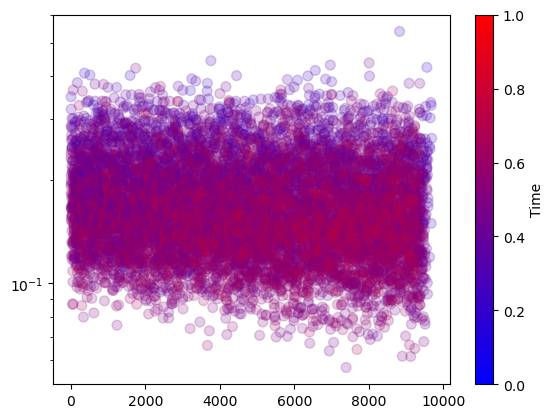

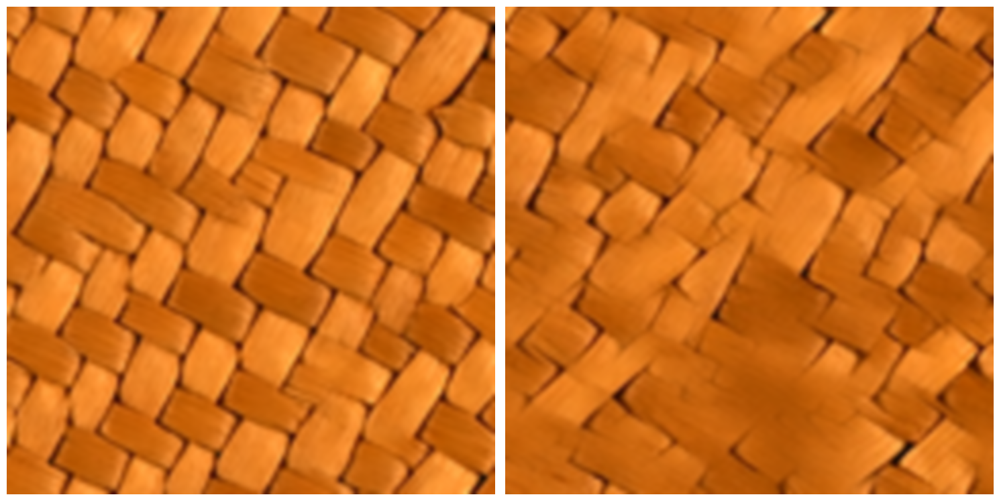

/tmp/ipykernel_20860/744585923.py:94: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  flow_model.load_state_dict(torch.load('raad%d.pth'%j, map_location='cuda'))
 12%|█▏      

KeyboardInterrupt: 

In [34]:
def train_flow_net(img_clean, model, device='cuda', epochs=30000,load=True,save_name='flow_model'):
    T=15
    data_rep = 'textures/'
    im_name  =  'red_peppers_256.jpg' # cordes_256.png      radishes_256.jpg    red_peppers_256.jpg      pumkins_512.png     rafia.jpg           tiles.png
    file_name = data_rep + im_name
    img_torch = Tensor_load(file_name)[...]
    img_torch0 = torch.clone(img_torch)*2-1
    mu,sigma=img_torch0.mean(),img_torch0.std()
    noise_plot=torch.randn(1,3,256,256).cuda()
    synth_patch=Diffusion(img_clean,rs=1,T=T,k=10,patchsize=16,stride=4,octaves=1,size=(256,256),renoise=0.5,warmup=0,memory=True,noise=noise_plot,show=False)
    l=[]
    times=[]
    model = model.to(device)
    if load:
        model.load_state_dict(torch.load(save_name+'.pth', map_location=device))
    model.train()
    img_clean = img_clean.to(device)
    
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
    loss_fn = nn.MSELoss()
    bs=8
    for epoch in tqdm(range(epochs)):
        t = torch.rand((bs,1,1,1), device=device)  # Random time for each epoch
        gt=torchvision.transforms.RandomCrop(64)(img_clean.repeat(bs,1,1,1))
        # Generate noisy input
        noise = torch.randn(bs,*gt.shape[1:]).cuda()
        img_noisy = gt*t + noise*(1-t)
        # Ground-truth flow
        true_flow = gt - noise
        
        # Predict flow
        pred_flow = model(img_noisy,t.squeeze(-1).squeeze(-1).squeeze(-1))


        loss = loss_fn(true_flow, pred_flow)

        optimizer.zero_grad()
        loss.backward()
        l.append(loss.detach().cpu().item())
        times.append(t.detach().cpu().mean().item())
        optimizer.step()

        if (epoch+1) % 10000 == 0:
            torch.save(model.state_dict(), '%s.pth'%save_name)
    

    fig, ax = plt.subplots()
    sc=ax.scatter(torch.arange(len(l))-torch.arange(len(l))*(1-torch.tensor(times))*.1,torch.tensor(l),color=[(1-t,0,t,.2) for t in times], s=50)
    plt.colorbar(cpick, ax=ax, label='Time')
    plt.yscale('log')
    plt.show()

    with torch.no_grad():
        x = noise_plot*1.
        times_=torch.linspace(0, 1, steps=T+1).cuda()
        for it in range(T):
            t=times_[it]
            t = t.to(device).unsqueeze(0)
            flow = flow_model(x,t.view(1))
            x=x+flow*(times_[it+1]-times_[it])

    synth_nn = x*sigma+mu
    Tensor_display(synth_nn[...,64:128+64,64:128+64], synth_patch[...,64:128+64,64:128+64]*sigma+mu)
    torch.save(model.state_dict(), '%s.pth'%save_name)






output_size = 512
t0 = time.time()
for j in range(1,13):
    im_name='raad%d.png'%j
    path=os.path.join('./comp/raad_256/', im_name)
    img_torch = Tensor_load(path)[...]
    img_torch0 = torch.clone(img_torch)*2-1
    os.makedirs('./comp/%s/FM'%(im_name.split('.')[0]), exist_ok=True)


    mu,sigma=img_torch0.mean(),img_torch0.std()



    flow_model = Unet(
        dim =16,
        dim_mults = (1, 2, 4, 4),
        mid_fourier=False)

    #flow_model = TimeConditionedUNet(base_channels=128)

    train_flow_net((img_torch0-mu)/sigma , flow_model,load=True,epochs=10000,save_name='raad%d'%j)

    flow_model.load_state_dict(torch.load('raad%d.pth'%j, map_location='cuda'))
    flow_model.eval().cuda()


    for i in range(10):
        torch.manual_seed(i)

        T=100
        noise_nn=torch.randn(1,3,512,512).cuda()
        noise=noise_nn[...,64:64+128,64:64+128]
        with torch.no_grad():
            x = noise_nn*1.
            times=torch.linspace(0, 1, steps=T+1).cuda()
            for it in range(T):
                t=times[it]
                t = t.to(device).unsqueeze(0)
                flow = flow_model(x,t.view(1))
                x=x+flow*(times[it+1]-times[it])

        synth_nn = x*sigma+mu
        #synth_nn=synth_nn[...,64:64+128,64:64+128]
        imsave('../comp/%s/FM/%d'%(im_name.split('.')[0],i),synth_nn)
         

In [35]:


output_size = 512
t0 = time.time()
for j in range(1,13):
    im_name='raad%d.png'%j
    path=os.path.join('./comp/raad_256/', im_name)
    img_torch = Tensor_load(path)[...]
    img_torch0 = torch.clone(img_torch)*2-1
    os.makedirs('./comp/%s/FM'%(im_name.split('.')[0]), exist_ok=True)


    mu,sigma=img_torch0.mean(),img_torch0.std()



    flow_model = Unet(
        dim =16,
        dim_mults = (1, 2, 4, 4),
        mid_fourier=False)

    #flow_model = TimeConditionedUNet(base_channels=128)

    #train_flow_net((img_torch0-mu)/sigma , flow_model,load=True,epochs=10000,save_name='raad%d'%j)

    flow_model.load_state_dict(torch.load('raad%d.pth'%j, map_location='cuda'))
    flow_model.eval().cuda()

    t0=time.time()
    for i in range(10):
        torch.manual_seed(i)
        T=15
        noise_nn=torch.randn(1,3,512,512).cuda()
        noise=noise_nn[...,64:64+128,64:64+128]
        with torch.no_grad():
            x = noise_nn*1.
            times=torch.linspace(0, 1, steps=T+1).cuda()
            for it in range(T):
                t=times[it]
                t = t.to(device).unsqueeze(0)
                flow = flow_model(x,t.view(1))
                x=x+flow*(times[it+1]-times[it])

        synth_nn = x*sigma+mu
        #synth_nn=synth_nn[...,64:64+128,64:64+128]
        imsave('../comp/%s/FM/%d'%(im_name.split('.')[0],i),synth_nn)
    print((time.time()-t0)/10)
         

/tmp/ipykernel_20860/847090692.py:24: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  flow_model.load_state_dict(torch.load('raad%d.pth'%j, map_location='cuda'))


0.2386544466018677
0.21483440399169923
0.23733584880828856
0.2927971363067627
0.22577219009399413
0.22324035167694092
0.22014350891113282
0.2120607614517212
0.21775741577148439
0.21607677936553954
0.23937649726867677
0.26809828281402587


/tmp/ipykernel_20860/1017977767.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  flow_model.load_state_dict(torch.load('peppers_small_rf.pth', map_location='cuda'))


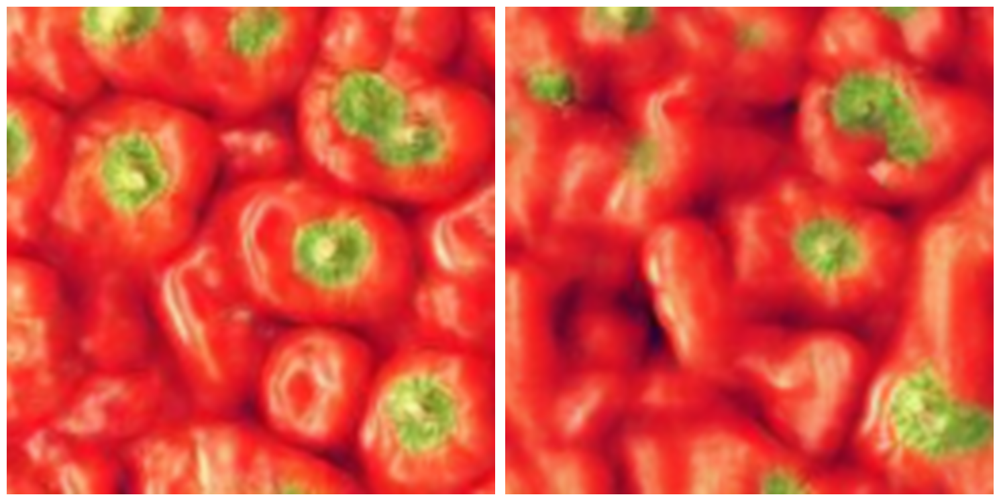

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1211.9913..52.973057].


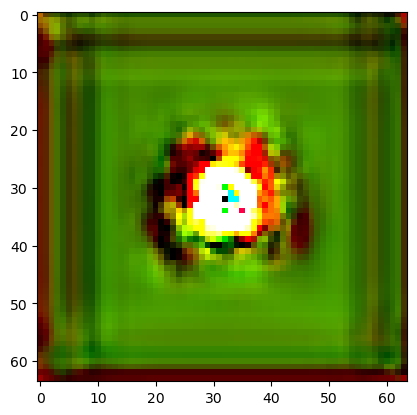

In [ ]:

data_rep = 'textures/'
im_name  =  'red_peppers_256.jpg' # cordes_256.png      radishes_256.jpg    red_peppers_256.jpg      pumkins_512.png     rafia.jpg           tiles.png
file_name = data_rep + im_name
img_torch = Tensor_load(file_name)[...]
img_torch0 = torch.clone(img_torch)*2-1
mu,sigma=img_torch0.mean(),img_torch0.std()

flow_model = Unet(
    dim =32,
    dim_mults = (1, 2),#, 4),
    mid_fourier=False)

T=15

#flow_model = TimeConditionedUNet(base_channels=128)
if False:
    train_flow_net((img_torch0-mu)/sigma , flow_model,load=False,epochs=10000,save_name='peppers_small_rf')
else:
    flow_model.load_state_dict(torch.load('peppers_small_rf.pth', map_location='cuda'))
flow_model.eval().cuda()
noise_plot=torch.randn(1,3,256,256).cuda()
synth_patch=Diffusion((img_torch0-mu)/sigma,rs=1,T=T,k=10,patchsize=16,stride=4,octaves=1,size=(256,256),renoise=0.5,warmup=0,memory=True,noise=noise_plot,show=False)


with torch.no_grad():
    x = noise_plot*1.
    times_=torch.linspace(0, 1, steps=T+1).cuda()
    for it in range(T):
        t=times_[it]
        t = t.to(device).unsqueeze(0)
        flow = flow_model(x,t.view(1))
        x=x+flow*(times_[it+1]-times_[it])

synth_nn = x*sigma+mu
synth_patch=synth_patch*sigma+mu
synth_nn=synth_nn[...,64:128+64,64:128+64]
synth_patch=synth_patch[...,64:128+64,64:128+64]
Tensor_display(synth_nn, synth_patch)#[...,64:128+64,64:128+64])

imsave('synth_nn_2',synth_nn)
imsave('synth_patch_2',synth_patch)

x0=torch.zeros(1,3,64,64).cuda()
x0[:,:,32,32]=1000
plt.imshow(flow_model(x0,torch.tensor(.5).view(1).cuda())[0].permute(1, 2, 0).detach().cpu().numpy())




#TODO: Train generic TAE